# Stock Trading App Tutorial Part 18 + Backtesting

## Part 18: [Historical Minute Data in SQLite](https://www.youtube.com/watch?v=5q6s6n1f8d8&list=PLvzuUVysUFOuoRna8KhschkVVUo2E2g6G&index=19)
- Historical minute data required for intraday strategy backtesting.
- Intend to obtain historical minute data for all stocks in the NASDAQ 100 for the past year.
- Backtrader: Backtesting framework used (https://www.backtrader.com/docu/).
- WARNING: 1 year of minute data would be several gigabytes of data.
    - Would require daily deletion of old day data in favour of new day data to keep it roughly the same size.
    - New table to store backtest data.
- Step 1: Get list of stock symbols for data fetching
    - Don't want to fecth minute data for all stocks within existing stock table due to space limitations.
    - 100 stocks will suffice.
    - ISSUE: `TimeSeries.get_intraday` cannot specify time interval of interest, only single month.
    - When looking at shorter timeframe data, espeically stocks have less volume (Thinly traded, less popular), minutes in data may be missing, will need to fill in.
        - CANNOT USE FUTURE DATA TO FILL IN HISTORICAL DATA.
        - Forward fill to mitigate missing value issue (Missing time has same price as that from previous minute).
        - Use `ffill()` to fill missing values by forward fill.
```python
import config 
import sqlite3 
import pandas 
import csv 
import alpaca_trade_api as tradeapi
from datetime import datetime, timedelta
from alpha_vantage.timeseries import TimeSeries

connection = sqlite3.connect(config.DB_FILE) # Connect to database
connection.row_factory = sqlite3.Row # To get dictionaries instead of tuples
cursor = connection.cursor() # To execute SQL statements

# ISSUE: MAY NOT BE ABLE TO ACCESS datetime WITH THIS FUNCTION
def get_minute_data_pop(ticker):
    ts = TimeSeries(key=config.API_KEY, output_format='pandas', indexing_type='date')
    df, _ = ts.get_intraday(ticker, interval='1min', outputsize='full') # RETURNS RECENT DATES
    df.rename(columns={"1. open": "open", "2. high": "high", "3. low": "low", "4. close": "close", "5. volume": "volume",  "date": "date"}, inplace=True)
    df = df.iloc[::-1]
    return df

api = tradeapi.REST(config.API_KEY, config.SECRET_KEY, base_url = config.API_URL, api_version = "v2") # config.py variables 
minute_bars = get_minute_data_pop(symbol).tz_localize('US/Eastern').resample("1min").ffill()
```

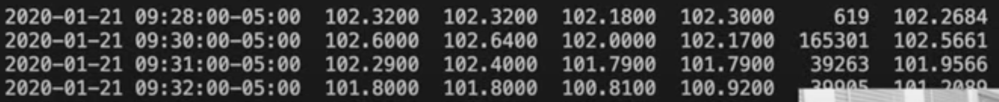

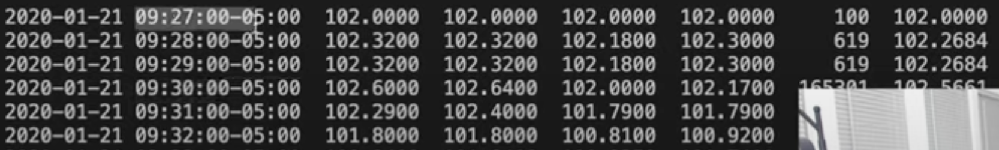

- Step 2: Loop through minutes obtained
    - Fetch symbols of interest from `qqq.csv`.
    - For each row, insert record into `sqlite3` database.
    - ISSUE: Cannot access specific week with `get_intraday()`, will likely have to do whole month.
```python
# ...
symbols = []
stock_dict = {} # Easy access of symbol and corresponding id
with open("qqq.csv") as f: 
    reader = csv.reader(f)
    for line in reader: 
        symbols.append(line[1])
cursor.execute("""
    SELECT * FROM stock
""")
stocks = cursor.fetchall() # Fetch results of query; returns list of tuples
for stock in stocks: 
    symbol = stock['symbol']
    stock_dict[symbol] = stock["id"]

valid_symbols = list(set(symbols).intersection(list(stock_dict.keys()))) # Ensure that stock id can be obtained
print(len(valid_symbols))

for symbol in valid_symbols: 
    start_date = datetime(2020, 1, 6).date() # Can change accordingly
    end_date_range = datetime(2020, 11, 20).date() # Can change accordingly
    while start_date < end_date_range: 
        # end_date = start_date + timedelta(days = 4) # ISSUE: Cannot access specific week with get_intraday(), will likely have to do whole month
        yearmonth = start_date.strftime('%Y-%m')
        print(f"===Fetching minute bars for {symbol} in year and month {yearmonth}")
        api = tradeapi.REST(config.API_KEY, config.SECRET_KEY, base_url = config.API_URL, api_version = "v2") # config.py variables 
        minute_bars = get_minute_data_pop(symbol, yearmonth).tz_localize('US/Eastern').resample("1min").ffill() # Results not guranteed
    
        # Index is timestamp, row is stock data
        for index, row in minute_bars.iterrows(): 
            # print(index) 
            # print(row) 
            cursor.execute("""
                INSERT INTO stock_price_minute (stock_id, datetime, open, high, low, close, volume) VALUES (?, ?, ?, ?, ?, ?, ?)
            """, (stock_dict[symbol], index.isoformat(), row["open"], row["high"], row["low"], row["close"], row["volume"]))
            # cursor.execute("""
            #     INSERT INTO stock_price_minute (stock_id, datetime, open, high, low, close, volume) VALUES (?, ?, ?, ?, ?, ?, ?)
            # """, (None, None, row["open"], None, None, None, None))
        
        # start_date = start_date + timedelta(days = 7) # Increment only after all other code has run
        start_date = start_date + relativedelta(months=1)

connection.commit() # To commit changes to databases
```

- Example: `AAPL`
    - Gaps in minute data due to being pre-market data.
    - Polygon function can only give certain number of days/bars at a time.
    - `timedelta` to send data week by week, iterate over weeks with multiple requests.

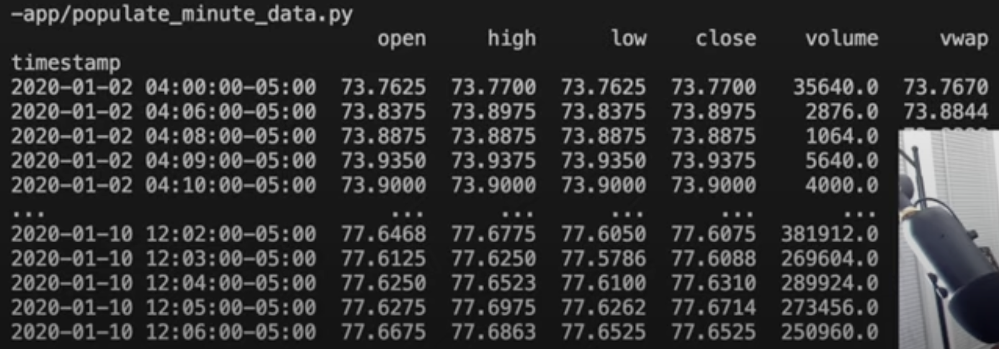

## Part 19: [Opening Range Breakout Backtest with Python and Backtrader](https://www.youtube.com/watch?v=ouveMWaInn8&list=PLvzuUVysUFOuoRna8KhschkVVUo2E2g6G&index=20)
- Write backtrader backtest to run backtest for all stock symbols with minute data available and provide results.
    - Amount of money made/lost trading each of those stocks.
    - Which stocks were more effective.
    - What characterstics benefit/detriment such pricings.
### `backtest.py`
- Start with connecting to database `app.db` with `slite`, converting it to a list of dictionaries, and creating cursor.
- Select all unique `stock_id` in `stock_price_minute` table to get list of stocks.
- Run backtest for each stock in the stock list.
```python
if __name__ == '__main__':
    conn = sqlite3.connect(config.DB_FILE)
    conn.row_factory = sqlite3.Row
    cursor = conn.cursor()
    cursor.execute("""
        SELECT DISTINCT(stock_id) as stock_id FROM stock_price_minute
    """)
    stocks = cursor.fetchall()
    for stock in stocks:
        # ...
```

### Backtesting process
- Instantiate `backtrader.Cerebo()` (https://www.backtrader.com/docu/cerebro/); control centre to be used as central point for:
    - Gathering all inputs (Data Feeds), actors (Stratgegies), spectators (Observers), critics (Analyzers) and documenters (Writers) ensuring the show still goes on at any moment.
    - Execute the backtesting or live data feeding/trading.
    - Returning the results.
    - Giving access to the plotting facilities.
- Set $\$100000$ for Cerebo broker account.
- Set `cerebo.addsizer()` as amount to purchase on any given body.
    - Default is to buy and sell 1 share exactly.
    - Provide certain percent/amount of cash to use when executing trade.
    - In this case, effectively going all in by using 95%.
- Provide data feed.
    - Previously accomplished with CSV file, can also use Pandas dataframe.
    - Will use database itself as data feed.
    - Use `pandas.read_sql()` to execute SQL query with `stock_id` as variable and return a Pandas dataframe.
    - Use `backtrader.feeds.PandasData()` to accept Pandas dataframe.
- Add data feed and strategy (In this case, function called `OpeningRangeBreakout`)
- Run `cerebo`.
    - Replay minutes and apply strategy class to minute part data.
    - Can plot data to visualise when buys and sells occur.
    - `cerebo.optstrategy()` to optimise `OpeningRangeBreakout` strategy after running 15-minute strategy by default based on provided parameters (In this case, opening range).
```python
    # ...
    for stock in stocks:
        print(f"== Testing {stock['stock_id']} ==")

        cerebro = backtrader.Cerebro()
        cerebro.broker.setcash(100000.0)
        cerebro.addsizer(backtrader.sizers.PercentSizer, percents=95)

        dataframe = pandas.read_sql("""
            select datetime, open, high, low, close, volume
            from stock_price_minute
            where stock_id = :stock_id
            and strftime('%H:%M:%S', datetime) >= '09:30:00' 
            and strftime('%H:%M:%S', datetime) < '16:00:00'
            order by datetime asc
        """, conn, params={"stock_id": stock['stock_id']}, index_col='datetime', parse_dates=['datetime'])

        data = backtrader.feeds.PandasData(dataname=dataframe)

        cerebro.adddata(data)
        cerebro.addstrategy(OpeningRangeBreakout)

        # strats = cerebro.optstrategy(OpeningRangeBreakout, num_opening_bars=[15, 30, 60])

        cerebro.run()
        # cerebro.plot()
```

### Core strategy class 
- Create new class extending `backtrader.Strategy` which provides base functionality of object.
- Default `num_opening_bars` parameter of 15 (First 15 minutes).
- Intitialise values for instance upon instantiation within `def __init__(self)`; all values are 0, False or None.
- Basic logging utility function `def log()` to print details.
```python
class OpeningRangeBreakout(backtrader.Strategy):
    params = dict(
        num_opening_bars=15
    )

    def __init__(self):
        self.opening_range_low = 0
        self.opening_range_high = 0
        self.opening_range = 0
        self.bought_today = False
        self.order = None
    
    def log(self, txt, dt=None):
        if dt is None:
            dt = self.datas[0].datetime.datetime()

        print('%s, %s' % (dt, txt))
    # ...
```
- `def notify_order()` (https://www.backtrader.com/docu/quickstart/quickstart/#do-not-only-buy-but-sell)
    - Check on order status, whether it is submitted, accepted or filled
    - Calls `log()` to display details
    - Once order is successfully processed, will set order to None.
```python
    # ...
    def notify_order(self, order):
        if order.status in [order.Submitted, order.Accepted]:
            # Buy/Sell order submitted/accepted to/by broker - Nothing to do
            return

        # Check if an order has been completed
        if order.status in [order.Completed]:
            order_details = f"{order.executed.price}, Cost: {order.executed.value}, Comm {order.executed.comm}"

            if order.isbuy():
                self.log(f"BUY EXECUTED, Price: {order_details}")
            else:  # Sell
                self.log(f"SELL EXECUTED, Price: {order_details}")
        
        elif order.status in [order.Canceled, order.Margin, order.Rejected]:
            self.log('Order Canceled/Margin/Rejected')

        self.order = None
    # ...
```

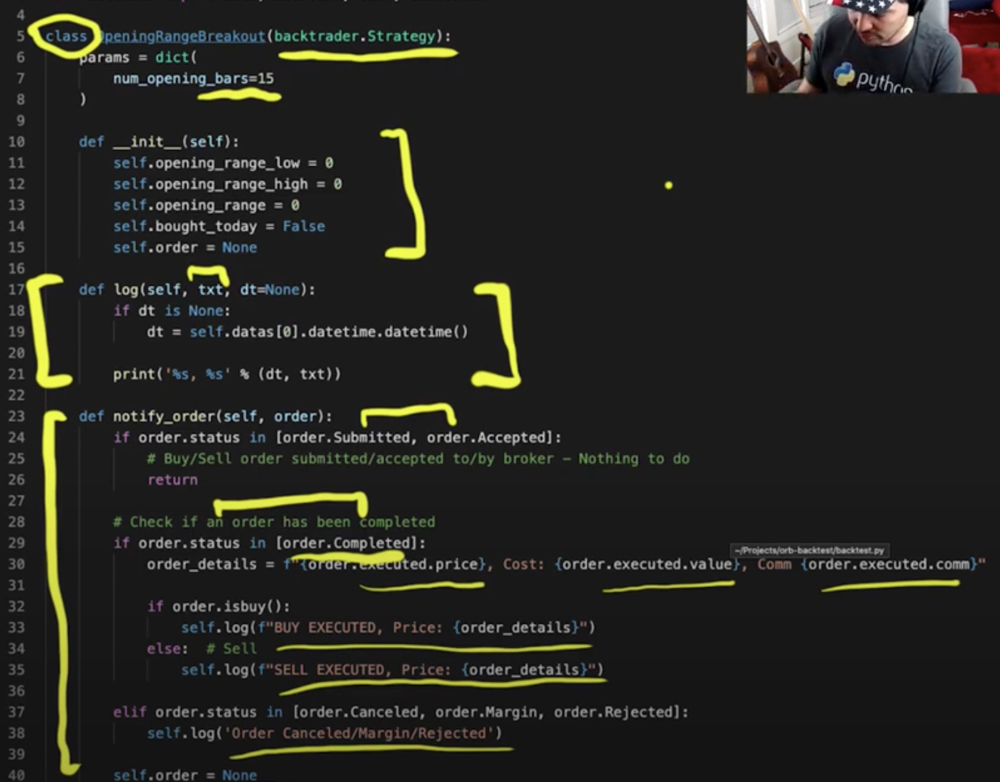

- `def next()`
    - Implement algorithm for each minute of data.
    - `self.data` contains minute bar data, with 0th index being current minute and -1th index being previous minute.
    - `num2date()` to convert an array of integers into datetime objects.
    - Due to processing multiple dates, reset `opening_range_high` and `opening_range_low` when different date is being processed.
    - Start time is 0930, end time of opening range is sum of number of opening bars on top of start time.
    - If currently inside opening range: Keep track of maximum high and minimum low obtained, keep calculating price range within opening.
    - If currently out of opening range without position:
        - If order made, do nothing.
        - If order does not exist and has not been placed today, `close > opening_range_high`: Buy provided order.
    - If currently out of opening range with position:
        - If `close > (opening_range_high + opening_range)` (Limit): Close the position at a profit.
        - If `close < (opening_range_high - opening_range)` (Stop loss): Close the position at a stop loss.
        - If close to closing time (e.g. 1545) (Liquidation): Liquidate position.
```python
    # ...
    def next(self):
        current_bar_datetime = self.data.num2date(self.data.datetime[0])
        previous_bar_datetime = self.data.num2date(self.data.datetime[-1])

        # Resetting values on new day
        if current_bar_datetime.date() != previous_bar_datetime.date():
            self.opening_range_low = self.data.low[0]
            self.opening_range_high = self.data.high[0]
            self.bought_today = False

        # Opening range
        opening_range_start_time = time(9, 30, 0)
        dt = datetime.combine(date.today(), opening_range_start_time) + timedelta(minutes=self.p.num_opening_bars)
        opening_range_end_time = dt.time()

        # Inside opening range
        if current_bar_datetime.time() >= opening_range_start_time \
            and current_bar_datetime.time() < opening_range_end_time:           
            self.opening_range_high = max(self.data.high[0], self.opening_range_high)
            self.opening_range_low = min(self.data.low[0], self.opening_range_low)
            self.opening_range = self.opening_range_high - self.opening_range_low
        # Outside opening range
        else:
            # Order already made
            if self.order:
                return
            # Limit profit
            if self.position and (self.data.close[0] > (self.opening_range_high + self.opening_range)):
                self.close()
            # Buy provided order 
            if self.data.close[0] > self.opening_range_high and not self.position and not self.bought_today:
                self.order = self.buy()
                self.bought_today = True
            # Stop loss
            if self.position and (self.data.close[0] < (self.opening_range_high - self.opening_range)):
                self.order = self.close()
            # Liquidation
            if self.position and current_bar_datetime.time() >= time(15, 45, 0):
                self.log("RUNNING OUT OF TIME - LIQUIDATING POSITION")
                self.close()
    # ...
```

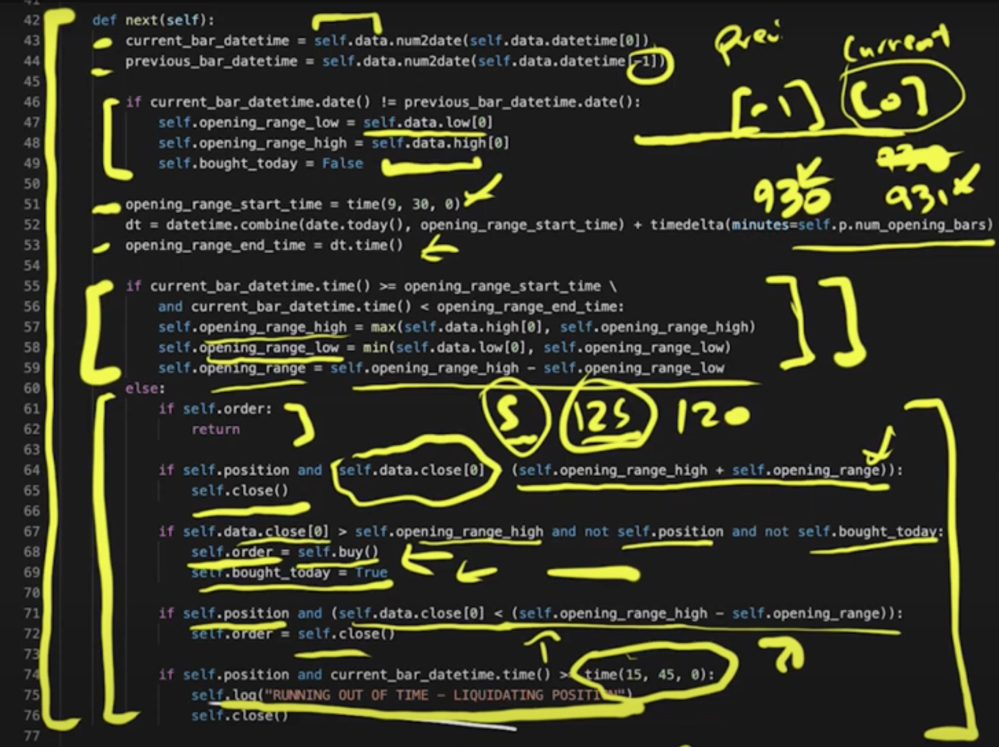

- `def stop()`
    - Function that runs at the end of the strategy.
    - Logs out the number of bars and provides final result.
```python
    # ...
    def stop(self):
        self.log('(Num Opening Bars %2d) Ending Value %.2f' %
                 (self.params.num_opening_bars, self.broker.getvalue()))

        if self.broker.getvalue() > 130000:
            self.log("*** BIG WINNER ***")

        if self.broker.getvalue() < 70000:
            self.log("*** MAJOR LOSER ***") 
    # ...
```

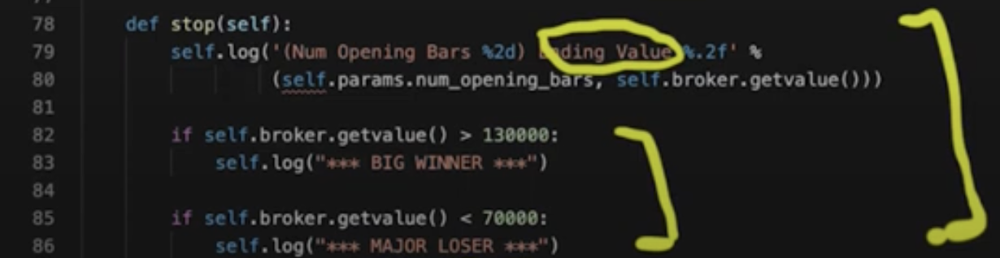

## Example backtesting process 
1. Comment out everything except the first print in each stock; testing works fine, will want indexing for faster processing.
2. Instantiate `cerebro` but do nothing with it; same result as above.
3. Obtain only first stock (Stock ID 142) and fetch all minute data from `stock_price_minute`.

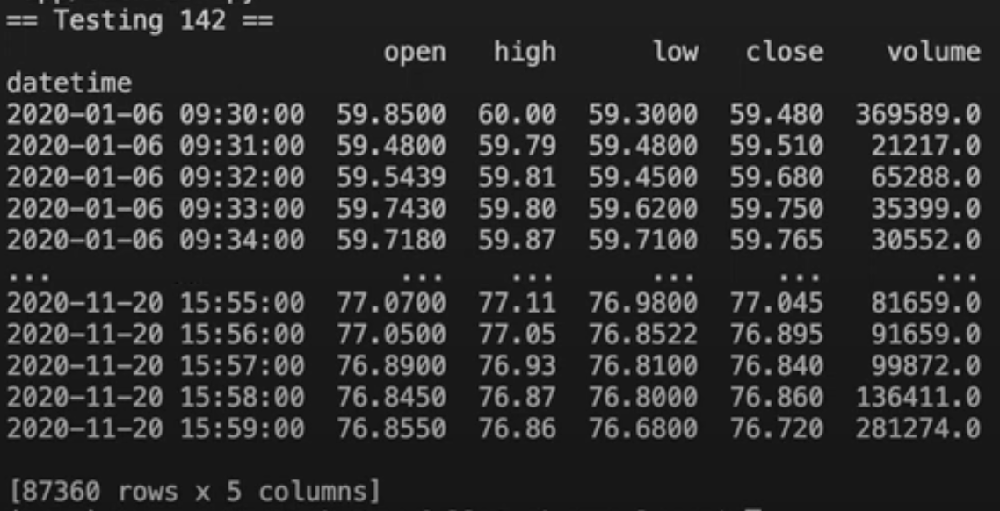

4. Add data and strategy to `cerebro`; nothing happens due to all of the strategy being commented out.
5. Uncomment most of the strategy except for most of `next()` in place of printing only; will print data of interest.
    - Prices print properly
    - `current_bar_datetime` and `previous_bar_datetime` print properly as strings.

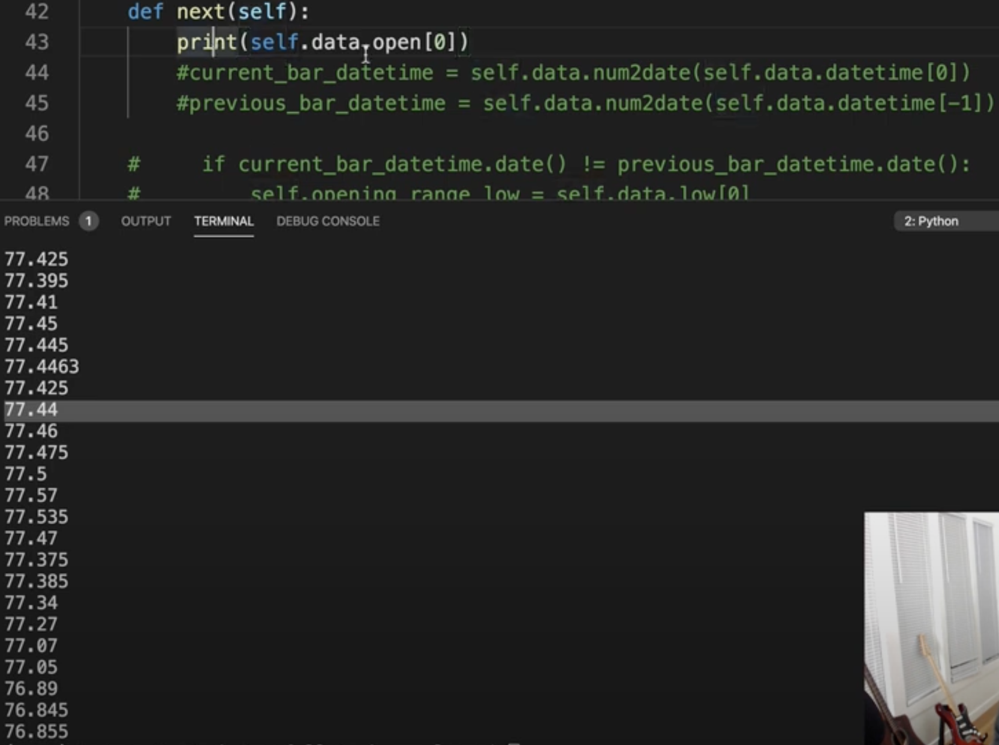

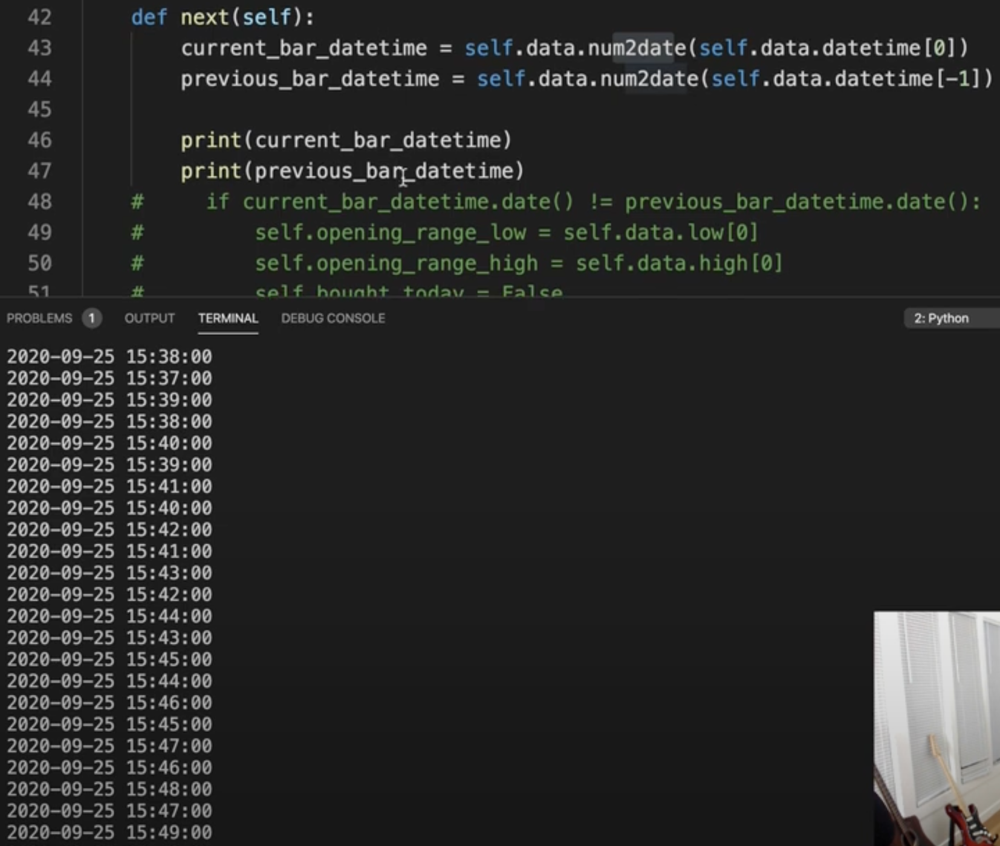

6. Uncomment out the rest for proper backtesting for stock with ID 142.
    - Test 1: $\$99999.36$; slight net loss, not successful.
7. Repeat backtesting with all symbols.

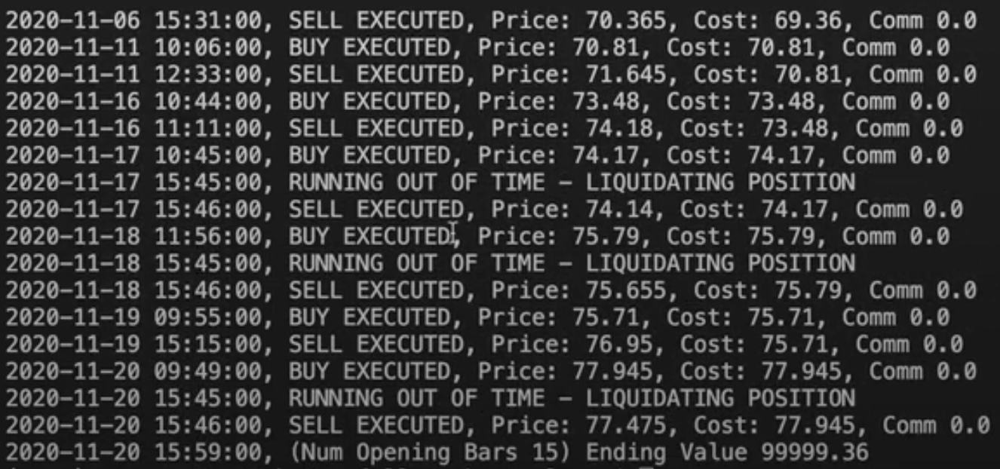

## Final results
- AMD, MAR are successful

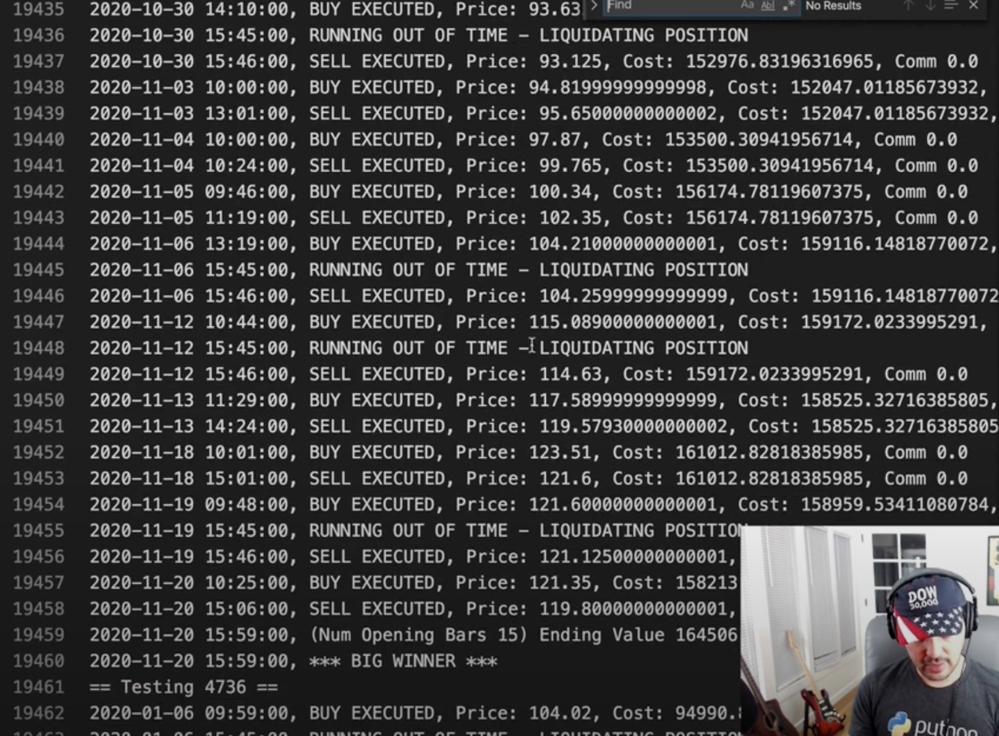

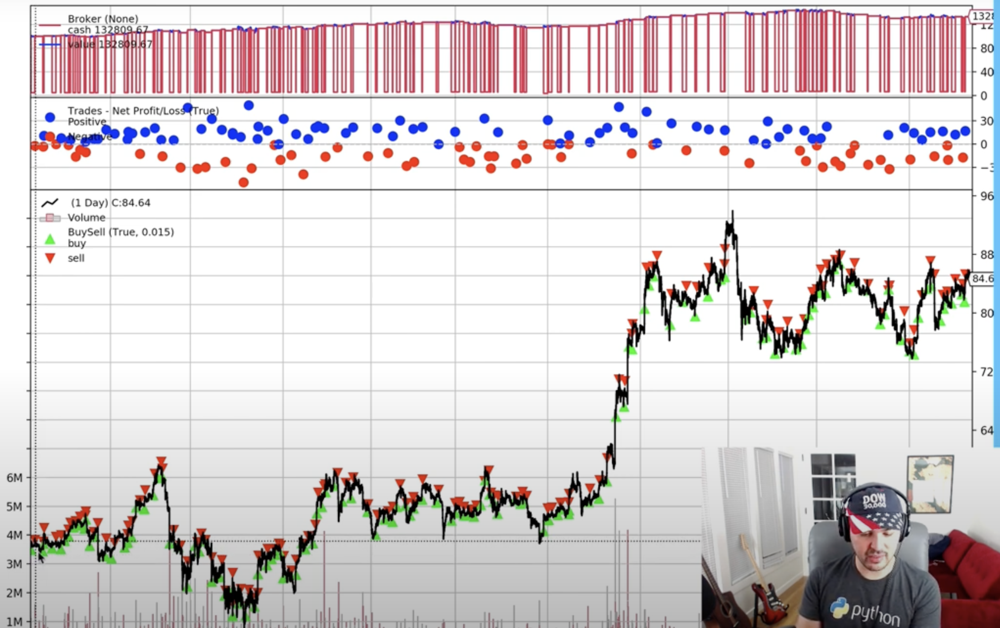

## Issues
- `trade.log` CRON code.
```
Traceback (most recent call last):
  File "/Users/student/Documents – SNG058/Self-Learning/Algo Trading Models/Stock Trading App Tutorial/opening_range_breakout.py", line 3, in <module>
    import alpaca_trade_api as tradeapi
ModuleNotFoundError: No module named 'alpaca_trade_api'
```
- `populate.log` CRON code.
```
Traceback (most recent call last):
  File "/Users/student/Documents – SNG058/Self-Learning/Algo Trading Models/Stock Trading App Tutorial/populate_stocks.py", line 3, in <module>
    import alpaca_trade_api as tradeapi 
  File "/Users/student/Library/Python/3.9/lib/python/site-packages/alpaca_trade_api/__init__.py", line 3, in <module>
    from .rest import REST, TimeFrame, TimeFrameUnit  # noqa
  File "/Users/student/Library/Python/3.9/lib/python/site-packages/alpaca_trade_api/rest.py", line 4, in <module>
    import requests
ModuleNotFoundError: No module named 'requests'
```